In [33]:
import os
import torch
from models.wta_cnp import WTA_CNP


root_path = "/home/yigit/projects/mbcnp/outputs/experimental/62D/"
run_id, model_folder = f'1700650332', '/saved_models/'
models_path = f'{root_path}{run_id}{model_folder}'

wta_model_path = f'{models_path}wta_on_synth.pt'

y = torch.load(f'{root_path}{run_id}/y.pt').cpu()
num_samples, t_steps, dy = y.shape
dx = 1
batch_size = 1

x = torch.linspace(0, 1, t_steps).repeat(batch_size, 1).view(batch_size, -1, 1)
colors = ['tomato', 'aqua', 'limegreen', 'gold', 'mediumslateblue', 'lightcoral', 'darkorange', 'teal']

wta = WTA_CNP(1, dy, 10, 10, [512, 512, 512], num_decoders=1, decoder_hidden_dims=[512, 512, 512], batch_size=batch_size)

wta.load_state_dict(torch.load(wta_model_path))
wta.eval()

WTA_CNP(
  (encoder): Sequential(
    (0): Linear(in_features=63, out_features=512, bias=True)
    (1): ReLU()
    (2): Linear(in_features=512, out_features=512, bias=True)
    (3): ReLU()
    (4): Linear(in_features=512, out_features=512, bias=True)
  )
  (decoders): ModuleList(
    (0): Sequential(
      (0): Linear(in_features=513, out_features=512, bias=True)
      (1): ReLU()
      (2): Linear(in_features=512, out_features=512, bias=True)
      (3): ReLU()
      (4): Linear(in_features=512, out_features=124, bias=True)
    )
  )
  (gate): Sequential(
    (0): Linear(in_features=512, out_features=1, bias=True)
    (1): Softmax(dim=-1)
  )
)

In [34]:
def get_batch(idx=[0], cond_idx=[0]):
    batch_obs = torch.zeros(batch_size, len(cond_idx), dy+dx, dtype=torch.float32)
    batch_obs[:, :, 0] = x[0, cond_idx, 0]

    batch_obs[:, :, 1:] = y[idx, cond_idx, :].view(batch_size, len(cond_idx), dy)
    
    return batch_obs, y[idx, :, :]

In [35]:
test_ind = 0
tar = torch.linspace(0, 1, t_steps).unsqueeze(0).unsqueeze(-1).repeat(batch_size, 1, 1)

obs, real_y = get_batch(list(range(batch_size)), [test_ind])

print(obs.shape, real_y.shape, tar.shape)

with torch.no_grad():
    pred_wta, gate = wta(obs, tar)

out_traj = pred_wta[0, 0, :, :dy].cpu().numpy()

torch.Size([1, 1, 63]) torch.Size([1, 698, 62]) torch.Size([1, 698, 1])


In [36]:
print(out_traj.shape)

(698, 62)


In [48]:
from dm_control.locomotion.walkers.cmu_humanoid import _POSITION_ACTUATORS

#dm_control_dim_id: mocap_dim_id
indices = {0:16,1:17,2:18,3:50,4:51,5:52,6:47,7:48,8:49,9:19,
           10:20,11:21,12:53,13:54,14:55,15:0,16:1,17:2,18:28,19:29,
           20:38,21:39,22:40,23:41,24:46,25:36,26:37,27:33,28:42,29:43,
           30:3,31:4,32:13,33:14,34:15,35:22,36:27,37:11,38:12,39:8,
           40:23,41:24,42:30,43:31,44:32,45:44,46:34,47:35,48:45,49:5,
           50:6,51:7,52:25,53:9,54:10,55:26}

dm_traj = torch.zeros((t_steps, 56))
for i in range(t_steps):
    for j in range(56):
        dm_traj[i, j] = torch.tensor(y[0, i, indices[j]]) # / _POSITION_ACTUATORS[indices[j]][1][1]


/tmp/ipykernel_4546/1949910362.py:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dm_traj[i, j] = torch.tensor(y[0, i, indices[j]]) # / _POSITION_ACTUATORS[indices[j]][1][1]


In [49]:
# dm_traj = torch.zeros((t_steps, 56))
# s_traj = y[0, :, :]
# for i in range(t_steps):
#     for j in range(56):
#         dm_traj[i, j] = s_traj[i, indices[j]] / _POSITION_ACTUATORS[indices[j]][1][1]

In [50]:
from dm_control import suite
from dm_control.locomotion.examples import basic_cmu_2019
import numpy as np
from matplotlib import pyplot as plt
from dm_control.locomotion.walkers import cmu_humanoid
from dm_control import viewer

env = basic_cmu_2019.cmu_humanoid_go_to_target()
walker = cmu_humanoid.CMUHumanoidPositionControlled()
time_step = env.reset()

action_spec = env.action_spec()

actions = np.zeros((t_steps, 56))
for i in range(t_steps):
    actions[i, :] = walker.cmu_pose_to_actuation(dm_traj[i, :])

# print(actions[5, :]))

action_spec: BoundedArray(shape=(56,), dtype=dtype('float64'), name='walker/headrx\twalker/headry\twalker/headrz\twalker/lclaviclery\twalker/lclaviclerz\twalker/lfemurrx\twalker/lfemurry\twalker/lfemurrz\twalker/lfingersrx\twalker/lfootrx\twalker/lfootrz\twalker/lhandrx\twalker/lhandrz\twalker/lhumerusrx\twalker/lhumerusry\twalker/lhumerusrz\twalker/lowerbackrx\twalker/lowerbackry\twalker/lowerbackrz\twalker/lowerneckrx\twalker/lowerneckry\twalker/lowerneckrz\twalker/lradiusrx\twalker/lthumbrx\twalker/lthumbrz\twalker/ltibiarx\twalker/ltoesrx\twalker/lwristry\twalker/rclaviclery\twalker/rclaviclerz\twalker/rfemurrx\twalker/rfemurry\twalker/rfemurrz\twalker/rfingersrx\twalker/rfootrx\twalker/rfootrz\twalker/rhandrx\twalker/rhandrz\twalker/rhumerusrx\twalker/rhumerusry\twalker/rhumerusrz\twalker/rradiusrx\twalker/rthumbrx\twalker/rthumbrz\twalker/rtibiarx\twalker/rtoesrx\twalker/rwristry\twalker/thoraxrx\twalker/thoraxry\twalker/thoraxrz\twalker/upperbackrx\twalker/upperbackry\twalker/up

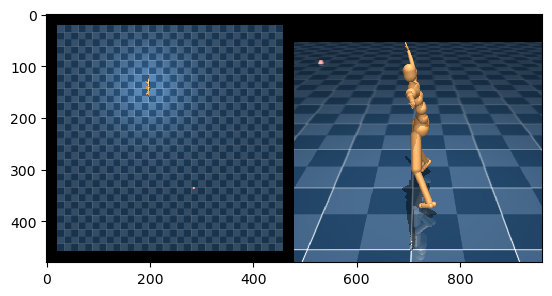

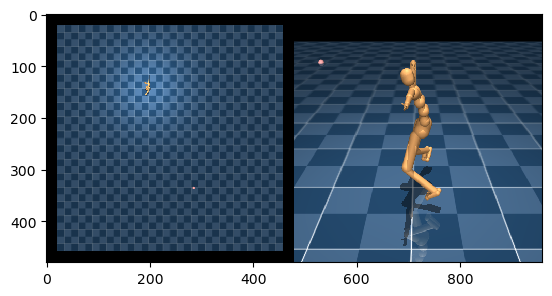

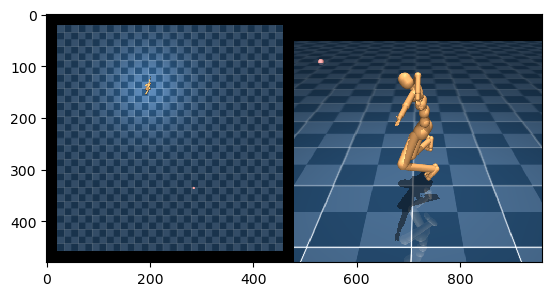

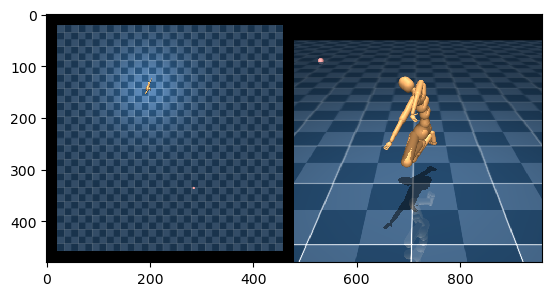

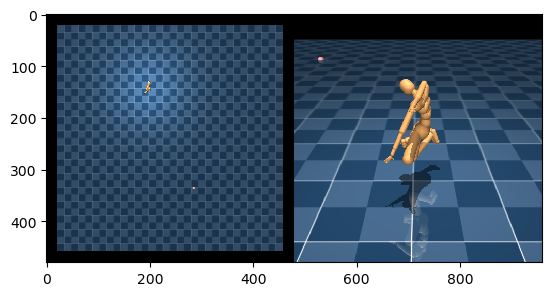

...

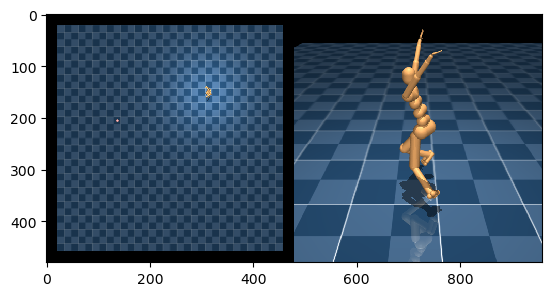

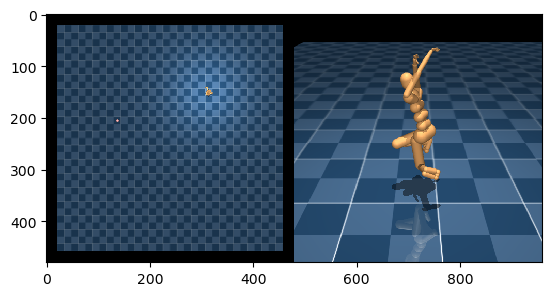

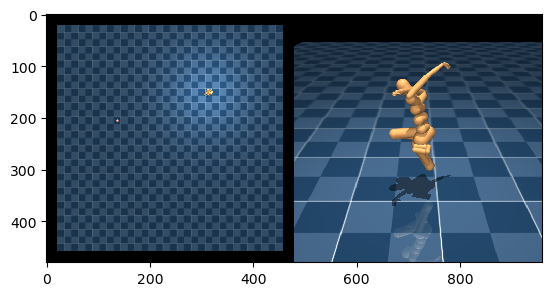

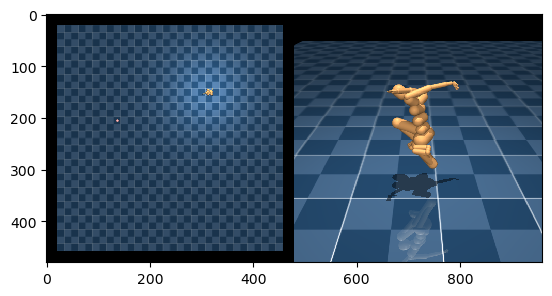

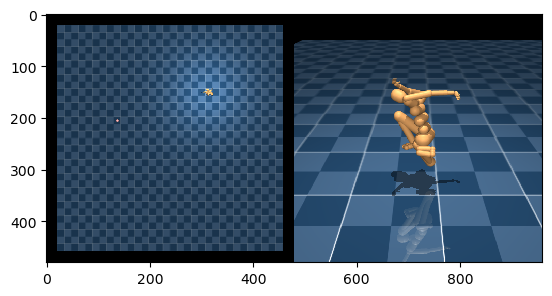

KeyboardInterrupt: 

In [52]:
from dm_control import suite
from dm_control.locomotion.examples import basic_cmu_2019
import numpy as np
from matplotlib import pyplot as plt
from dm_control import viewer

env = basic_cmu_2019.cmu_humanoid_go_to_target()
time_step = env.reset()

action_spec = env.action_spec()

print('action_spec:', action_spec)

width = 480
height = 480
video = np.zeros((698, height, 2 * width, 3), dtype=np.uint8)

# # Step through an episode and print out reward, discount and observation.
# action_spec = env.action_spec()
# time_step = env.reset()

viewer.launch(env)

# # for i in range(698):  # Run for 1000 steps as an example
# #     action = out_traj[i, 6:]
# #     print(action)
# #     break
# #     env.step(action)

for i in range(t_steps):
    action = actions[i, :]
    time_step = env.step(action)
    video[i] = np.hstack([env.physics.render(height, width, camera_id=0),
                          env.physics.render(height, width, camera_id=1)])

for i in range(t_steps):
    img = plt.imshow(video[i])
    plt.pause(0.01)  # Need min display time > 0.0.
    plt.draw()


In [1]:
import mujoco
import mujoco.viewer

In [19]:
env = suite.load(domain_name="humanoid", task_name="stand")
viewer = mujoco.viewer.launch_passive(env._physics.model, env._physics.data)

ValueError: `model` is not a mujoco.MjModel: got <dm_control.mujoco.wrapper.core.MjModel object at 0x7fbc8cf94040>

In [8]:
from dm_control import suite
from dm_control import viewer

# Load an environment from the Control Suite.
env = suite.load(domain_name="humanoid", task_name="stand")

# Launch the viewer application.
# viewer.launch(env)